<a href="https://colab.research.google.com/github/uol-mediaprocessing/group-projects-make-it-aesthetic/blob/master/MakeItAesthetic_HohmannKringLindanis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Make it Aesthetic!
![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Titel_Collage.jpg)

## Table of Content

1 Introduction

2 Goals

2.1 Samples and Criteria

2.2 Product

3 Theory and Methods

3.1 Rule of Thirds in Theory

3.2 How to Get There - A Process Pipeline

4 Process and Implementation

4.1 Basic Functions

4.2 Horizon Detection

4.2.1 Detect Lines With HoughLines Transformation

4.2.2 Crop the Image

4.2.3 Applications to Other Images

4.3 Salient Object Detection

4.3.1 Detect Salient Objects - First Approach

4.3.2 Detect Salient Objects - Second Approach

4.3.3 Detect Salient Object With PoolNet

4.3.4. Crop the Image

4.3.5 Applications to Other Images

5 Challanges

6 Limitations and Visions

7 Reflections and Conclusions

8 References

##1. Introduction

In the project "Make it Aesthetic" that is part of the module Media Processing held at Carl-von-Ossietzky University of Oldenburg we have the aim to make existing photos more aesthetic.

A lot of people take photos to record certain situations or a particularly beautiful moment in nature, such as a sunset.

Nowadays almost everyone takes photos but not everyone follows certain guidelines that for example a professional photographer would follow. In order to make it possible for everyone to align their photos according to guidelines, we want to develop an algorithm in our project which aligns and cuts the pictures according to these guidelines. To reach this goal it is necessary to define the guidelines of an aesthetic photo and to define which object is the main object of the photo.

##2. Goals
We are interested in (professional) photography and take a lot of photos in our leisure time. Not everyone (including us) knows all the guidelines for taking aesthetic photos and invests time in learning the guidelines and how to apply them. Nevertheless we all want to take beautiful and aesthetic photos. This is where we want to start: We want to make aesthetic photography accessible to everyone by simplifying the way to an aesthetic photo for the user. But it is not our aim to tell the user how to take an aesthetic photo but offering him and her a tool to generate an aesthetic photo out of a photo that do not follows the rules of aesthetic photography (see chapter 3 for a more detailed description). With our algorithm everybody should be able to record every moment in a beautiful, aesthetic photo. 

In order to achieve this goal, we want to edit and align the images by zooming, rotating and cropping according to the guidelines of aesthetic photography.

###2.1 Samples and Criteria
In our project we decided to distinguish two fields: on one hand images with lines like landscape with horizons or buildings and on the other hand images with objects like flowers, portraits, and creatures. The pictures we chose to develop and test our algorithm should not be too complex. That means they should have a clear color contrast. For example the background is bright and the object is dark (image 1) or vice versa (image 2).


With regard to images with objects, there should be only one object that needs to be aligned, and this object should be larger than the other objects in the image. For all images it is necessary that the salient regions are sharp. The background may be blurred. You can see these criteria in the sample images 1 and 2.

> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/SamplesANDCriteria_object.jpg)

Furthermore especially the landscapes and buildings should have strong and clear lines.


> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Samples_lines.jpg)

###2.2 Product
On the one hand, the algorithm implemented by us is used to have certain images, such as beach images from a holiday, aligned with a horizon according to a specific guideline. On the other hand, the user can have individual objects aligned on the images so that this alignment also complies with this specific guideline. This guideline is discussed in more detail in the next chapter. You can also use this algorithm to align and adjust a certain number of images according to certain criteria, so that you can then print a photo book from these newly created images. Otherwise, the photographer can simply select the most beautiful pictures after his photography tour and adjust and save them according to the rules. In summary, our product is designed to help users achieve the goals described in chapter 2 to capture certain moments and situations in great pictures.

To make use of these advantages, the user only has to enter the photo and at the end of the process he or she will have the finished cropped and aligned image. This has the great advantage that the user no longer has to do this process manually. However, our algorithm is only designed for the photography Guideline Rule of Third and therefore the user cannot switch between the different guidelines. The Rule of Third is described in more detail in the next chapter.

##3. Theory and Methods

When a photographer browses through his photos, he may comes across photos that have not turned out to be beautiful. But this is no reason to delete all these photos. Because there are a number of guidelines that you can follow to transform those into beautiful pictures or just make good photos even more aesthetic. Many pictures have a great potential to look even better.
> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/methodsaesthetic.png)

These guidelines are there to make the pictures look more aesthetic. For example the Golden Section, the Diagonal Dominance, the Visual Balance, or the Rule of Third. In this project we focus on the Rule of Third which is described in the  chapter below. But to get a brief insight into the world of photography guides, the ones mentioned in **image 5** are briefly explained:

**a) Golden Section:** In photography, the Golden Section is helpful for a harmonious image composition. The Golden Section is nothing else than a division in a certain division ratio. Exactly this division ratio occurs extremely often in nature and is generally perceived by people as harmonious - probably because it occurs so often in nature. (Quelle: https://www.foto-kurs.com/bildgestaltung-goldener-schnitt.htm)

**b) Diagonal Dominance:** "A salient diagonal element creates a dynamic emphasizing effect. Indeed, one of the most common and effective uses for the diagonal is as a leading line - a line that causes the eyes of the viewers to fixate on the subjects along it." (compare https://people.mpi-inf.mpg.de/~chen/papers/photocompos.pdf)

**c) Visual Balance:** "An image that is balanced visually is one where the eye will concentrate on the main subject, but also be aware of other elements in the scene. These other elements will visually complement the subject rather than detract from it. Visual balance is often complementary to other compositional techniques, the rule of thirds, golden spiral leading lines and many others all require the image to be visually balanced." (Quelle: https://www.lightstalking.com/achieve-visual-balance-photography/ - direktes Zitat)

**d) Rule of Third:** In this guideline, the image is divided into different areas of equal size. The important subjects are aligned with lines and points of these areas and are no longer in the center of the image. 

> Quellen Bilder

We have chosen the Rule of Thirds for our project because it is applicable to many pictures and is a much used tool in art. In the context of this project we would like to focus on the balance in placement. This is possible even with the other guidelines described above, but the Rule of Thirds provides prominent points so the alignment can be calculated well.

###3.1 Rule of Thirds in Theory

"*The Rule of Third was written down by John Thomas Smith in 1797. It is a design rule in photography based on the theory of proportion.*" (compare https://en.wikipedia.org/wiki/Rule_of_thirds and https://de.wikipedia.org/wiki/Drittel-Regel)
> Quelle Zitat

In the Rule of Third the image is divided into thirds both horizontally and vertically, creating nine rectangles of equal size. According to the Rule of Third a photo is aesthetic when important lines in the image run along the lines and intersections of the lines of the Rule of Third. In addition, an image is aligned according to this rule if important objects are located at the intersections of the RT-lines.


To illustrate this procedure, the Rule of Third is now explained with an example photo:

**a) Original image:** On the original picture you can see that the lighthouse is relatively central and the horizon is also not on the line. If you now go into a program where you can align the picture by hand, you get the view from picture b).

**b) Aligned image with Rule of Third:** In this picture you can see the lines and the intersections of the Rule of Third. In the manual program the picture is moved manually so that the lighthouse lies on a vertical line and on a point of intersection and that the horizon lies on a horizontal line of the rule of third.

**c) Aligned image without Rule of Third:** As a result, you now have a beautifully aligned and aesthetically pleasing photo.

> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/ruleofthird.jpg)


In this project we have automated this procedure so that people no longer have to align the photos by hand. To achieve this goal, however, the photo must first go through a certain process. This process is described in the following chapter.



###3.2 How to get there - A Process Pipeline

The main steps of our project are shown in the graphic below. 
> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/ourprocess.jpg)

At the beginning of the project, we did not know how to implement these main steps. The methods to be applied were mostly the result of research during the course of the project. In some cases, we also rejected approaches because they did not work as imagined. In the list below you can see the steps more finely granulated :
* **camera pictogram**
* specify criteria
* find sample photos
* **read in image**
* **preprocess the image**
* calculate size of image
* calculate lines for the Rule of Thirds
* draw lines of the Rule of Thirds

The detection of horizons and objects and their alignment according to the rule of thirds is similar in the procedure. However, they are considered separately, as different functions are used to achieve the same result. 

* **detect horizon**
* detect edges
* detect lines in image
* extract points of line of horizon
* **crop image**
* calculate distance between horizon line and RT-lines
* calculate aspect ratio
* crop image accordingly
* **detect objects**
* detect salient objects
* detect edges of objects
* draw bounding boxes
* calculate centre of objects
* **crop image**
* calculate distance between midpoint and power points (intersections of RT-lines)
* calculate aspect ratio
* crop image accordingly

After the entered image has passed through this pipeline, the user receives a more aesthetic photo. 

Challenges we saw here were to find suitable photos. Also the methods for detecting the horizon and the objects were not yet clear to us and need to determined in the process of developing our algorithm. In addition, the project may reveal that the sample images are too complex.

##4. Process and Implementation

In this chapter we now describe the implementation of the project. First of all, we will look at the functions that all images have to pass through: the preprocessing. Subsequently, chapters 4. 2 Horizon Detection and 4. 3 Salient Object Detection explain the respective implementation and presents the concepts used. In all subchapters, only one picture (in some cases two) is used to explain the code. Only in the chapter "Application to Other Images"we apply the algorithm to more images. The aim is to display the results for images with different properties and to demonstrate the applicability of our algorithm.


###4.1 Basic Functions

In order to be able to execute the code throughout the entire project, we import all necessary packages centrally. 

The following packages are imported for specific reasons:
* **NumPy**: NumPy is a program library for the programming language Python, which allows an easy handling of vectors, matrices or generally large multidimensional arrays
* **cv2**: OpenCV is a free program library with algorithms for image processing and machine vision 
* **argparse**: The argparse module makes it easy to write user-friendly command-line interfaces
* **skimage**: The main package of skimage only provides a few utilities for converting between image data types
* **io**: Reading, saving, and displaying images and video
* **scipy.optimize**: SciPy optimize provides functions for minimizing (or maximizing) objective functions, possibly subject to constraints. It includes solvers for nonlinear problems (with support for both local and global optimization algorithms), linear programing, constrained and nonlinear least-squares, root finding and curve fitting
* **fsolve**: Find the roots of a function
* **matplotlib**: Matplotlib is a program library for the programming language Python, which allows to create mathematical representations of any kind
* **pyplot**: matplotlib.pyplot is a collection of command style functions that make matplotlib work like MATLAB
* **PIL**: Python Imaging Library (abbreviated as PIL) (in newer versions known as Pillow) is a free library for the Python programming language that adds support for opening, manipulating, and saving many different image file formats
* **Image**: The Image module provides a class with the same name which is used to represent a PIL image
* **ImageDraw**: The ImageDraw module provide simple 2D graphics for Image objects
* **math**: The math "module provides access to the mathematical functions defined by the C standard." (compare [math - Python documentation](https://docs.python.org/3/library/math.html))
* **torch**: "The torch package contains data structures for multi-dimensional tensors and  mathematical operations over these are defined.     Additionally, it provides many utilities for  efficient serializing of Tensors and arbitrary types, and other useful utilities. (run `help(torch)`)
* **torchvision**: The torchvision package consists of popular datasets, model architectures, and common image transformations for computer vision. (compare [torchvision - PyTorch documentation](https://pytorch.org/docs/stable/torchvision/index.html))

In [0]:
import numpy as np
import cv2
import argparse
from skimage import io
from scipy.optimize import fsolve
from matplotlib import pyplot as plt
from PIL import Image
from PIL import Image, ImageDraw
import math
# import Pytorch for saliency detection with DeepL
import torch
import torchvision

Since we have to read in all images first and convert them from the BGR color space to the RGB color space, we have combined these commands into one function. This simplifies the loading of the images and avoids errors, as no command can be forgotten. 

In [0]:
def load_image(name):
  image = cv2.imread(name) # loads picture from disk
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # corrects color of image
  return image

The following commands load the required images from Github. Such blocks of code can be found at the beginning of some chapters, as this allows us to use all images throughout the chapter. Furthermore, we have a central place to add images without losing track.

In [0]:
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/flower.JPEG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Taj_Mahal.jpg

As we focus on the **Rule of Third (RT)** the first step to work with the Rule of Third is to find out how big the scanned images are in the x-axis (width of image) and in the y-axis (height of image). That happens with the ```shape``` function. The shape of an image is accessed by ```img.shape```. It returns a tuple of the number of rows, columns, and channels (if the image is color). Height is at index 0, width is at index 1; and number of channels at index 2. To calculate the first line for the RT it divides the height (resp. the width) of the photo by 3. Therefore the "//" operator is used since we need integer values for the further processing. For the second horizontal line the height is divided by 3 too but now the result is multiplied by 2. Similarly for the vertical line.

In [0]:
def generate_image_data(img):
  height = img.shape[0]
  width = img.shape[1]

  #calulating the lines for the rule of thirds
  third_of_height_1 = height // 3
  third_of_height_2 = (height // 3) * 2
  third_of_width_1 = width // 3
  third_of_width_2 = (width // 3) * 2
  return width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2


**Calculation of the lines of interest**

The following function called ```draw_rule_of_thirds``` is used to draw the lines of the *Rule of Thirds* (RT) on the given photo. The function requires an object of type *img* and it returns an object of type *img*.

After the preprocessing in the ```generate_image_data``` function we have all information to draw the RT-lines. Therefore we use the ```cv2.line``` function from *OpenCV* for the horizontal lines and the vertical lines. We decided to use this function instead of the functions provided by *matplotlib* because we would like to show multiple images at the same time later on in the project to be able to compare images with each other. When we used the ```plt.axhlines``` resp. ```plt.axvlines``` from *matplotlib* (compare  https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.axhline.html) we get all lines in one image but not in the images we wanted. To draw the lines with the ```cv2.line``` function we calculate the line thickness according to the size of the image and we use the ```CV_AA``` as line type to draw all lines with the same thickness. 

Since we have images with different colours we have to draw the RT-lines in black or white depending on the average colour of the picture. To determine the average colour we add up all pixels of the gray version of the image and divide the sum by total amount of pixels of the image matrix.



At the end the function returns the photo with the RT-lines in it. Since we call this function in the following only for the purpose of verification, it is reasonable that the lines are drawn into the image. If you do not want to appear in the image, the function should not be called.

In [0]:
def draw_rule_of_thirds(img):
  img = img.copy()
  #calulating the height and width of the image and the lines for the rule of thirds
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)

  #calculating the average_brightness of the image
  img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  average_brightness = img_gray.sum() // (len(img_gray)*len(img_gray[0]))
 
  black = (0,0,0)
  white = (255,255,255)
  thickness = max(width, height) // 200 
  #define the line color in dependence of the brightness
  if average_brightness >= 129:
    #drawing the lines on the photo calculated above
    #drawing the horizontal lines
    cv2.line(img, (0, third_of_height_1), (width, third_of_height_1), black, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (0, third_of_height_2), (width, third_of_height_2), black, thickness=thickness, lineType=cv2.LINE_AA)
    
    #drawing the vertical lines  
    cv2.line(img, (third_of_width_1, 0), (third_of_width_1, height), black, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (third_of_width_2, 0), (third_of_width_2, height), black, thickness=thickness, lineType=cv2.LINE_AA)
  
  else:
    #drawing the lines on the photo calculated above
    #drawing the horizontal lines
    cv2.line(img, (0, third_of_height_1), (width, third_of_height_1), white, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (0, third_of_height_2), (width, third_of_height_2), white, thickness=thickness, lineType=cv2.LINE_AA)

    #drawing the vertical lines
    cv2.line(img, (third_of_width_1, 0), (third_of_width_1, height), white, thickness=thickness, lineType=cv2.LINE_AA)
    cv2.line(img, (third_of_width_2, 0), (third_of_width_2, height), white, thickness=thickness, lineType=cv2.LINE_AA)

  return img

To be able to display multiple images at the same time, the ```plot``` function was created. It gets the images and the corresponding image titles that are to be displayed.  

In [0]:
def plot(images, titles, cols = None, show_ticks = False):
  if cols is None:
    cols = min(len(images), 3)
  
  rows = math.ceil(len(images) / cols)

  for i in range(len(images)):
    plt.subplot(rows, cols, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])

    if not show_ticks:
      plt.xticks([])
      plt.yticks([])
  
  # FIXME: adjusts the subplots with respect ratio of the first image but needs some tunings
  first_image = images[0]
  height = first_image.shape[0]
  width = first_image.shape[1]
  aspect_ratio =  width / height
  is_landscape= aspect_ratio > 1
  if is_landscape :
    plt.subplots_adjust(left=0, bottom=0, right=3, top=2)
  is_portrait= aspect_ratio < 1
  if is_portrait:
    plt.subplots_adjust(left=0, bottom=0, right=2, top=3)
  is_square_format = aspect_ratio == 1
  if is_square_format:
   plt.subplots_adjust(left=0, bottom=0, right=3, top=3)

  plt.show()
  return


To see the result of the preprocessing, all the functions from above are combined to one function:

In [0]:
def preprocessing(img_name):
  img = load_image(img_name)
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
  print('width =', width)
  print('height =', height)
  print('vertical lines:', '1st line =', third_of_width_1, ', 2nd line =', third_of_width_2)
  print('horizontal lines:', '1st line =', third_of_height_1, ', 2nd line =', third_of_height_2)
  print('')
  img_with_rtLines = draw_rule_of_thirds(img)
  titles = ['Original Image', 'Image with RT-Lines']
  images = [img, img_with_rtLines]
  plot(images, titles)

This function was written for demonstration purposes only and is not used in the project later on. 

By using this method, the preprocessing can be seen in an example. In the first example the RT-lines are white because the background is almost black.

width = 6016
height = 4000
vertical lines: 1st line = 2005 , 2nd line = 4010
horizontal lines: 1st line = 1333 , 2nd line = 2666



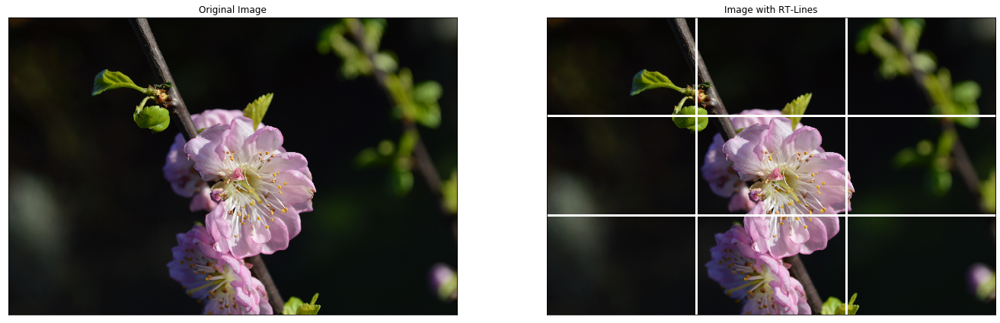

In [8]:
preprocessing('flower.JPEG')

In the second example, the lines are black because the average color is bright due to the light blue sky and the white Taj Mahal. 

width = 2592
height = 1944
vertical lines: 1st line = 864 , 2nd line = 1728
horizontal lines: 1st line = 648 , 2nd line = 1296



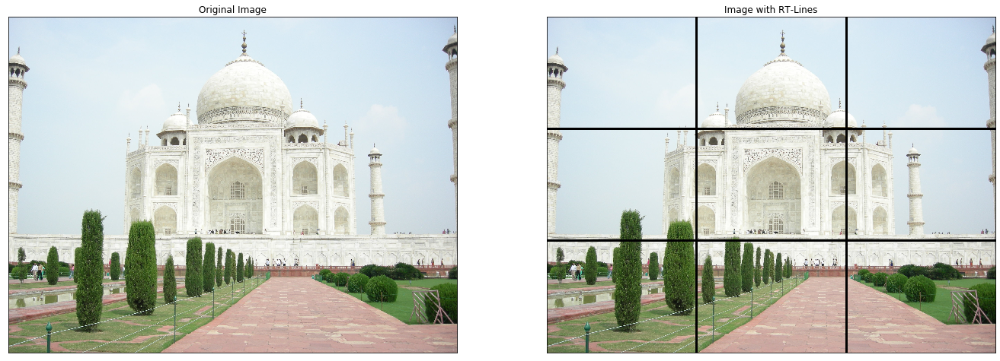

In [9]:
preprocessing('Taj_Mahal.jpg')

As you can see here, the image is already aligned with the horizontal lines. It would only have to be shifted a bit to the right so that either the path is centered on the right vertical line or the entrance of the Taj Mahal.



###4.2 Horizon Detection

Aligning a photo according to the Rule of Thirds requires that important horizontal and vertical lines in the image lie on the lines of the Rule of Thirds. In the following, we have focused on aligning horizontal lines, as we mainly look at landscapes in this chapter. In order for the horizontal lines to be aligned, they must first be recognized. This is explained in subchapter *4.2.1 Detect Lines with Hough Line Transform*. The following subchapter *4.2.2 Crop the Image* discusses the method of cropping and explains the implementation. In the last subchapter of horizon detection, a lot of sample images are tested and evaluated. 




####4.2.1 Detect Lines with HoughLine Transformation

The lines of the Rule of Third serve as orientation to align certain features in the photo with it. So for example also the horizon. We want to achieve to recognize the horizon and then align it with the lines of interest.

In the function `process_img` the image is loaded again with the function `generate_image_data` with all values calculated in the function. In `vertices`, we specify the area in which the lines for the horizon are to be recognized. That means, that in the area above the upper line of interest and below the lower line of interest the detectable lines in the image are ignored.


Then the `processed_img` is generated. It is generated with the function `roi` which stands for **Region of Interest**. This function gets the image and the vertices as parameters.

> ![mask](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/mask_horizon.jpg)

First, an empty mask is created with `np.zeros_like`. The mask is filled with `cv2.fillPoly`, in this case, a rectangle in the size of one third of the image. As you can see in the image above. This function gets the empty mask passed as an image, the vertices and the color with which the polygonal area resulting from the vertices should be filled. In this case it is white. The photo and the filled mask are now connected with `cv2.bitwise_and`. So in the end only what is not white will be displayed.

In [0]:
def roi(img, vertices):
    #blank mask:
    mask = np.zeros_like(img)
    # fill the mask
    cv2.fillPoly(mask, vertices, 255)
    # now only show the area that is the mask
    masked = cv2.bitwise_and(img, mask)
    return masked

def process_img(img):
    height, width, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)

    vertices = np.array([[0,third_of_height_1],[width,third_of_height_1], [width,third_of_height_2],[0,third_of_height_2]], np.int32)
    processed_img = roi(img, [vertices])
    
    return processed_img

In order to be able to recognize the horizon in an image, a copy (**np.copy**) of the image is first created because the original should not be changed. 

A pre-processing of the image must take place so that the horizon can be recognized. At first the image is converted into **grayscale** because less information needs to be provided for each pixel. Then the grayscaled image is filtered with **GaussianBlur** for reducing image noise and details. On the blurred picture we apply the **Canny Algorithm** for extracting useful structural information from different vision objects and dramatically reducing the amount of data to be processed. After that the mask of the function **process_img** is applied.

The next step is to extract a better line of the horizon. This is done with **dilation**. Dilation is a morphological basic operation in digital image processing. 

The **Hough-Transformation** is a robust global method for the recognition of straight lines, circles or any other parameterizable geometric figures in a binary gradient image, i.e. a black-and-white image, after an edge detection. This is used for detecting the horizon. The arguments rho, theta, threshold, min_line_length, max_line_gap and line_image are necessary. We use **HoughLinesP** with probabilities because we can add a **max_line_gap** so that gaps are ignored and we will have a better line. If lines are detected they will be drawn.

In [0]:
def detect_horizon(img):
  img = img.copy()
  #preprocessing of the image to detect lines
  gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (9,9),2)
  edges = cv2.Canny(blur,50,150,apertureSize = 3)
  processed_img = process_img(edges)
 
  #dilate and erose the binary image to extract better lines
  kernel = np.ones((2,10),np.uint8)
  dilation = cv2.dilate(processed_img,kernel,iterations = 3)

  #get the width of the image to calculate the minimal length of the line in the
  #image in dependence of the width of the image
  height, width, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(dilation)
  
  #define the arguments for the function of the Hough Line Transformation
  rho = 1  # distance resolution in pixels of the Hough grid
  theta = np.pi / 180  # angular resolution in radians of the Hough grid
  threshold = 15  # minimum number of votes (intersections in Hough grid cell)
  min_line_length = int(width*0.05)  # minimum number of pixels making up a line
  max_line_gap = 80  # maximum gap in pixels between connectable line segments
  line_image = np.copy(img) * 0  # creating a blank to draw lines on

  # Run Hough on edge detected image
  # Output "lines" is an array containing endpoints of detected line segments
  lines = cv2.HoughLinesP(dilation, rho, theta, threshold, np.array([]),
                   min_line_length, max_line_gap)
  if lines is not None:
    for line in lines:
      for x1,y1,x2,y2 in line:
        #print(x1,y1,x2,y2)
        #draw the detected lines into the image
        image_line = cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),10)
        lines_edges = cv2.addWeighted(img, 0.8, line_image, 1, 0)
    
    horizon = aggregate_to_horizon(lines)
    return img, edges, dilation, image_line, lines_edges, lines, horizon
  else: #if no lines are detected
    print("Konnte leider keine Linien erkennen.") 

def aggregate_to_horizon(lines): 
  horizon = math.inf
  for line in lines:
    line = line[0]
    begin_x = line[0]
    begin_y = line[1]
    end_x = line[2]
    end_y = line[3]

    gradient = (begin_y - end_y) / (begin_x - end_x) 

    is_flat_enough = abs(gradient) < 0.1 

    if is_flat_enough:
      if begin_y < horizon:
        horizon = begin_y
      if end_y < horizon:
        horizon = end_y 

  return horizon

In [0]:
def get_Coordinates_of_horizon(lines):
  start_point = tuple(lines[0][0],lines[0][1])
  last_row, last_column = lines.shape
  print(last_row)
  end_point = tuple(lines[n][2],lines[n][3])

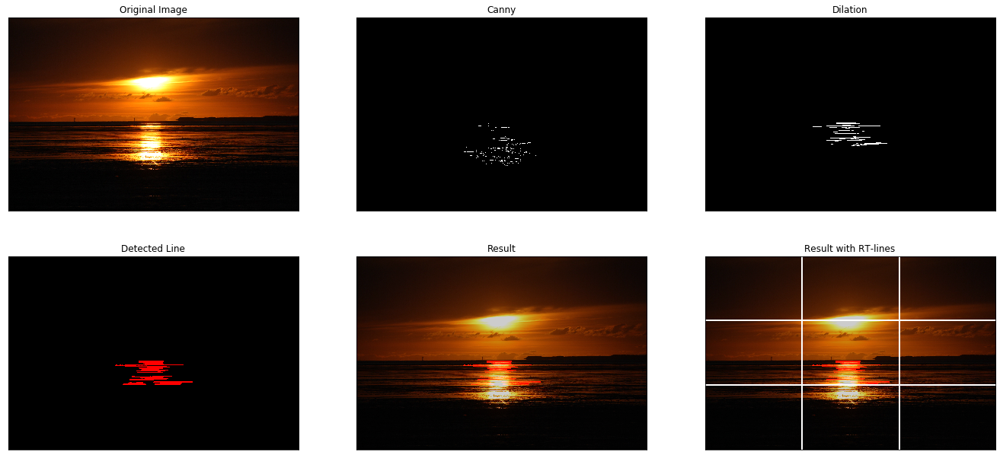

In [13]:
# show_detected horizon
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1359.JPG

img = load_image('IMG_1359.JPG')
result, edges, dilation, image_line, lines_edges, lines, horizon = detect_horizon(img)
result_with_rtLines = draw_rule_of_thirds(lines_edges)
titles = ['Original Image', 'Canny',
          'Dilation', 'Detected Line', 'Result', 'Result with RT-lines']
images = [img, edges, dilation, image_line, lines_edges, result_with_rtLines]

plot(images, titles)

####4.2.2 Crop the Image

After the horizon has been recognized, the next step is to align the horizon with the line of interest. To do this, the image must be cropped. This is done with the function ```crop_img```.

> ![crop lines](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/Berechnung_cropping_lines.jpg)
>
> ![result](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/cropped_lineImage_inTheory.jpg)

In this function the first index of the first array is the first point of detected horizon. Then the distance between the horizon and the second line of interest is calculated. After this step, the first and second cropping point is calculated . To crop the image proportionally, the left and right cropping point of the x axis is calculated at the end.

In [0]:
def crop_img(img):
  img = img.copy()
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
  img, edges, dilation, image_line, lines_edges, lines, horizon = detect_horizon(img)
      
  #cv2.line(img, (0, horizon), (width, horizon), (255, 0,0), thickness=10, lineType=cv2.LINE_AA)
  upper_horizon_distance = abs(third_of_height_1 - horizon)
  lower_horizon_distance = abs(third_of_height_2 - horizon)
  closer_to_upper_horizon = upper_horizon_distance < lower_horizon_distance

  aspect_ratio = width/height

  top_cropping = 0
  bottom_cropping = 0
  left_cropping = 0
  right_cropping = 0

  if closer_to_upper_horizon:
    top_cropping = int((3/2) * upper_horizon_distance)
  else:
    bottom_cropping = int((3/2) * lower_horizon_distance)
  
  # determine the left and right cropping_point of the x-asis, to crop the picture middle-weight
  new_height = height - top_cropping - bottom_cropping
  new_width = int(new_height * aspect_ratio)
  left_cropping = (width - new_width) // 2 
  right_cropping = left_cropping
    
  cropped_img = img[top_cropping:(height - bottom_cropping), left_cropping:(width - right_cropping)]

  return cropped_img  

In [0]:
def plot_cropped_using_rt(original_img):
  uncropped = original_img
  uncropped_rt = draw_rule_of_thirds(uncropped)
  cropped_img = crop_img(original_img)
  cropped_rt = draw_rule_of_thirds(cropped_img)

  titles = ['Original', 'Original with RT', 'Cropped', 'Cropped with RT']
  images = [img, uncropped_rt, cropped_img, cropped_rt]
  plot(images, titles, 4)
  #return

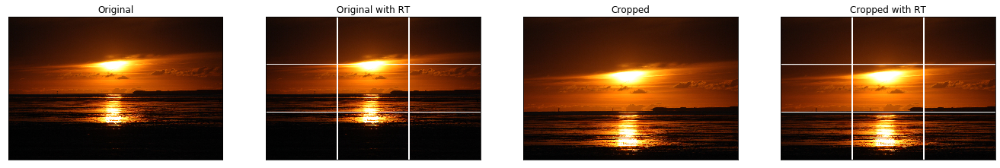

In [16]:
plot_cropped_using_rt(img)

####4.2.3 Application to other Images


> Bilderausgabe: Original, Original RT, Dilation, Rote Linien in Original, Zugeschnitten, Zugeschnitten mit RT 



In [0]:
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/goodhorizon.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/ex5.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/ex6.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/DSCN0053.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1374.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1370.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1363.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1359.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Sunset/IMG_1334.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGRom.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGBoat.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/Snow1.png
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSnow2.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSpain1.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSpain2.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGSun.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGPeople.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGDeich.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Horizon/IMGCastle.JPG

In [0]:
def create_aesthetic_image_with_lines(img_name):
  img = load_image(img_name)
  original_with_rtLines = draw_rule_of_thirds(img)
  # detects the horizon in the image
  result, edges, dilation, image_line, lines_edges, lines, horizon = detect_horizon(img)
  # crops the image according to the calculated values
  cropped_img = crop_img(img)
  cropped_img_with_rtLines = draw_rule_of_thirds(cropped_img)

  # cuts the ending of the file name
  if img_name.find('.jpg') != -1:
    img_name_without_dataformat = img_name.replace('.jpg', '')
  elif img_name.find('.JPG') != -1:
    img_name_without_dataformat = img_name.replace('.JPG', '')
  elif img_name.find('.png') != -1:
    img_name_without_dataformat = img_name.replace('.png', '')
  elif img_name.find('.jpeg') != -1:
    img_name_without_dataformat = img_name.replace('.jpeg', '')
  elif img_name.find('.JPEG') != -1:
    img_name_without_dataformat = img_name.replace('.JPEG', '')

  # save the aesthetic image as result  
  save_aesthetic = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB)
  cv2.imwrite('/content/aesthetic_'+img_name_without_dataformat+'.jpg', save_aesthetic)

  titles = ['Original Image', 'Original With RT-Lines',
            'Dilation', 'Result', 'Cropped Image', 'Cropped Image With RT-Lines']
  images = [img, original_with_rtLines, dilation, lines_edges, cropped_img, cropped_img_with_rtLines]

  plot(images, titles)

And now some examples:

The first photo shows a restless sea horizon with some ships. In the middle there is a boat with a mast that displays two edges on top (see Dilation). Here one can see that only lines of a certain length are detected (see Result) and therefore the horizon is still aligned correctly. 

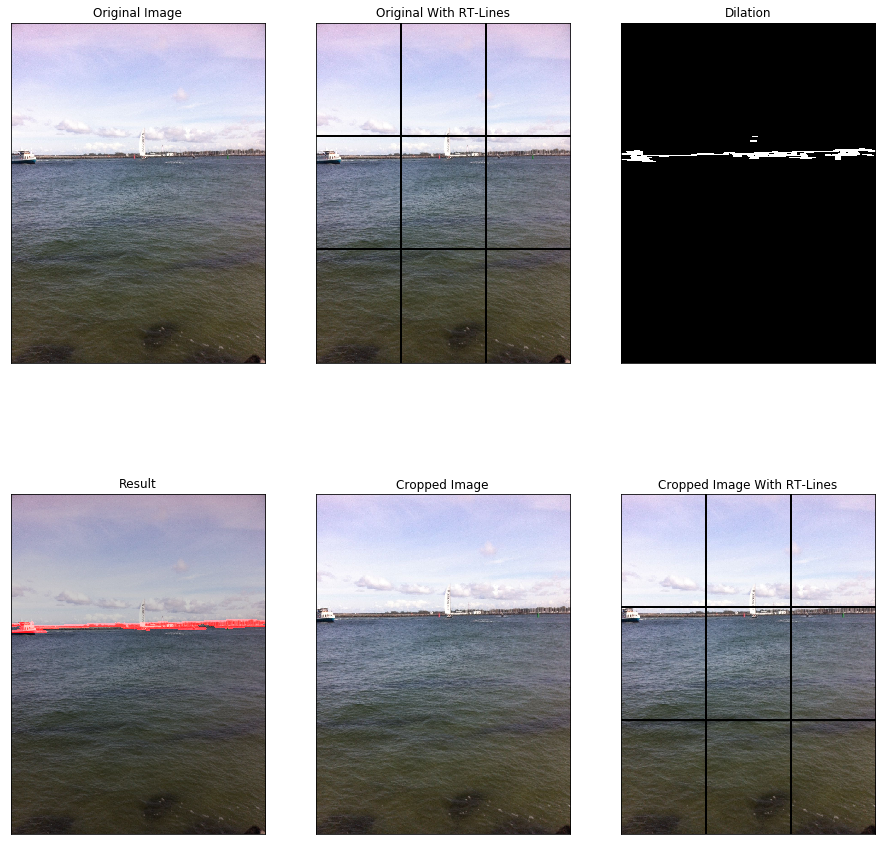

In [19]:
create_aesthetic_image_with_lines('ex5.JPG')

In the next picture, the function is used to exclude vertical lines from a certain angle. A vertical line is recognized on the left side but is not used for cropping.

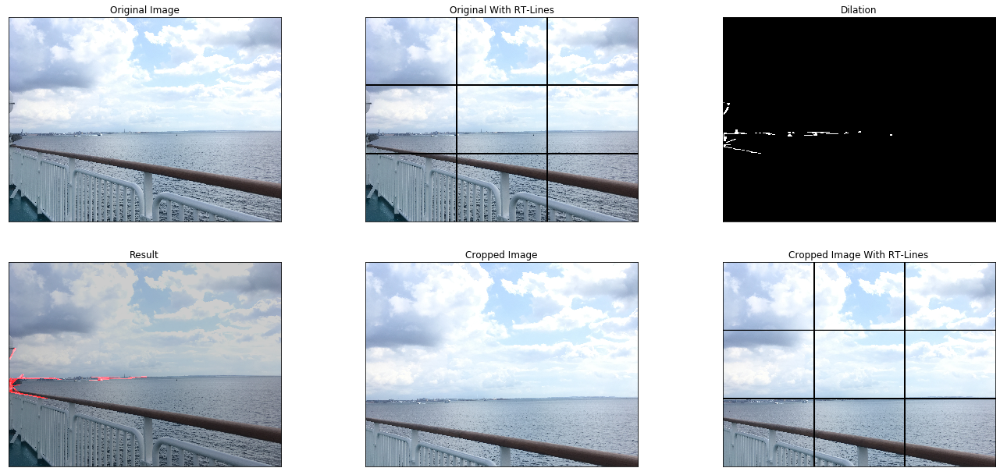

In [20]:
create_aesthetic_image_with_lines('ex6.JPG')

Now a sloping horizon is given. Nevertheless, the horizon is well regcognized and aligned.

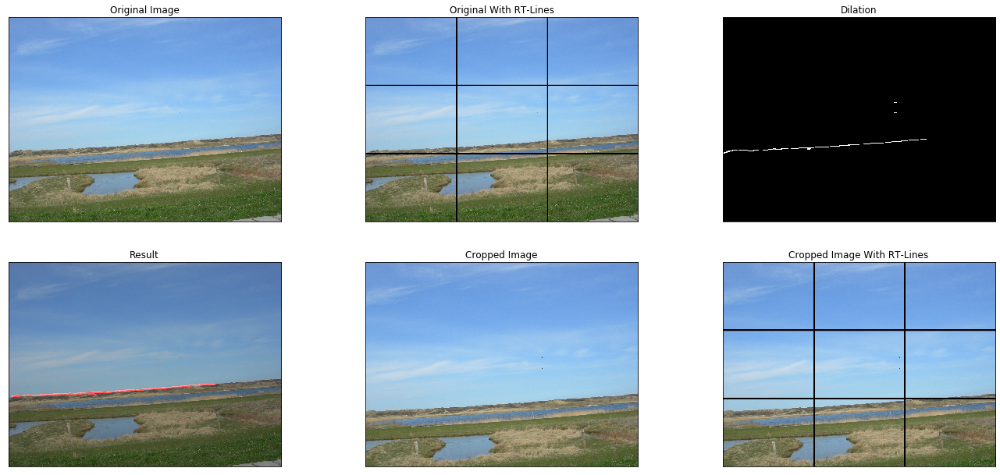

In [21]:
create_aesthetic_image_with_lines('DSCN0053.jpg')

At this picture you can see quite well, that only edges in the middle third are considered. Again, the horizon is aligned with the top line.

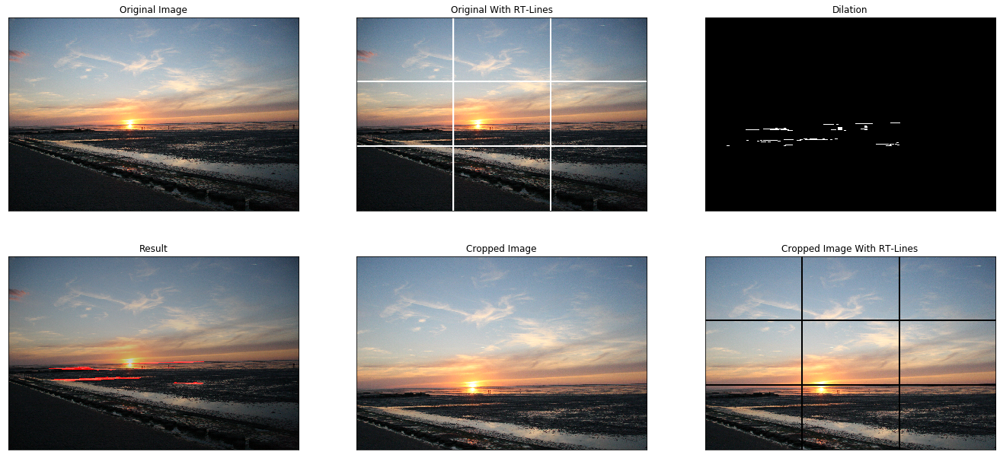

In [22]:
create_aesthetic_image_with_lines('IMG_1374.JPG')

The horizon is detected even with darker images.

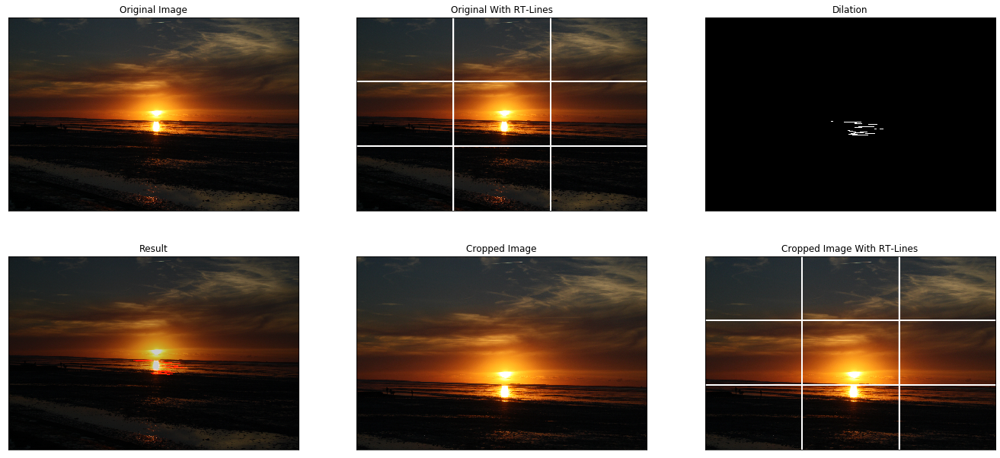

In [23]:
create_aesthetic_image_with_lines('IMG_1363.JPG')

Auch rausschmeißen?? wir hatten auch schon ein unruhiges Bild.

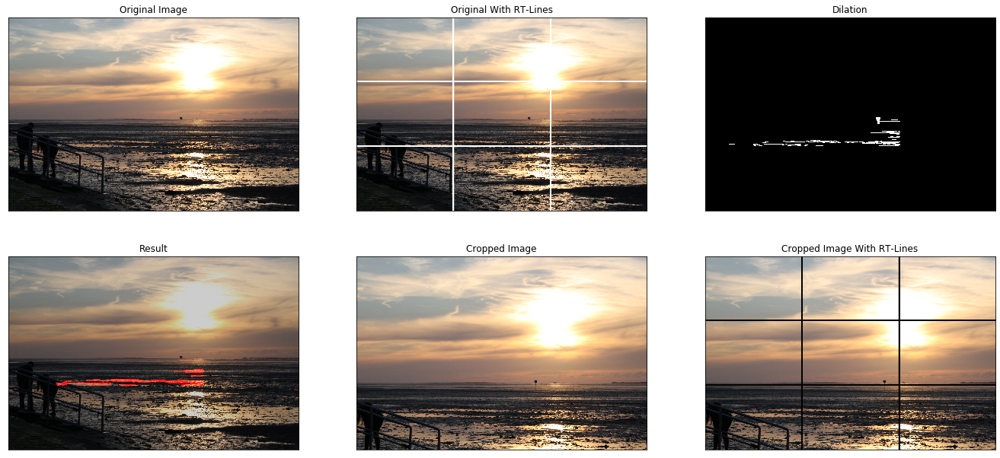

In [24]:
create_aesthetic_image_with_lines('IMG_1334.JPG')

In this picture a city is photographed. In the middle there is St. Peter's Cathedral with its dome protruding from the cityscape. Due to the limitations of sloping and too short lines, the horizon was also correctly recognized and aligned here, and not aligned with St. Peter's.

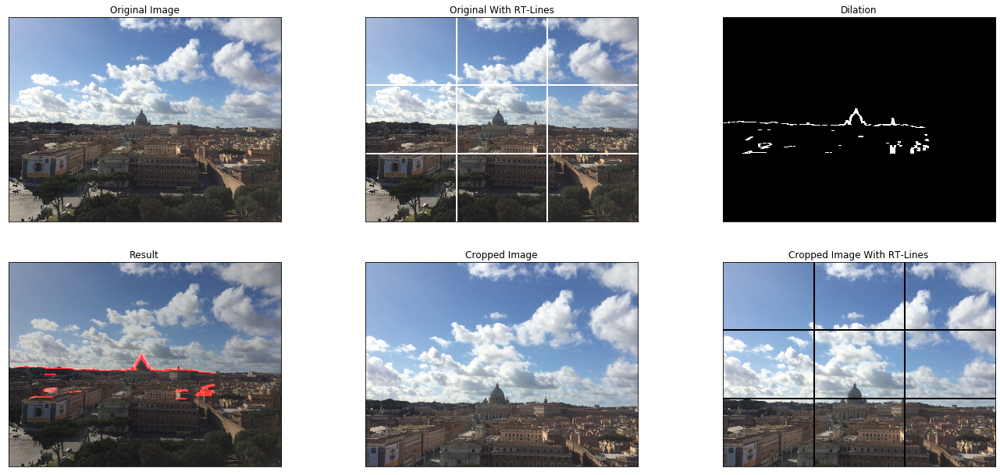

In [25]:
create_aesthetic_image_with_lines('IMGRom.JPG')

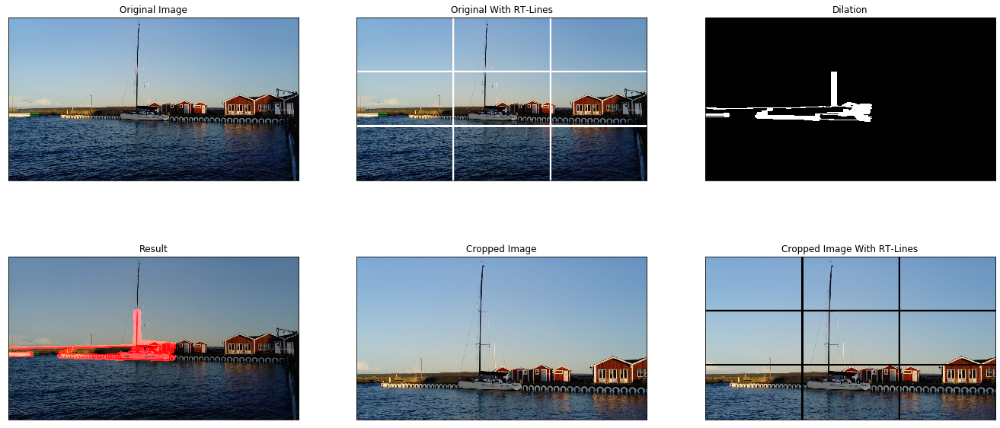

In [26]:
create_aesthetic_image_with_lines('IMGBoat.JPG')

This photo shows a snow landscape with trees on the horizon. Although the horizon is unsettled, it is still recognized.

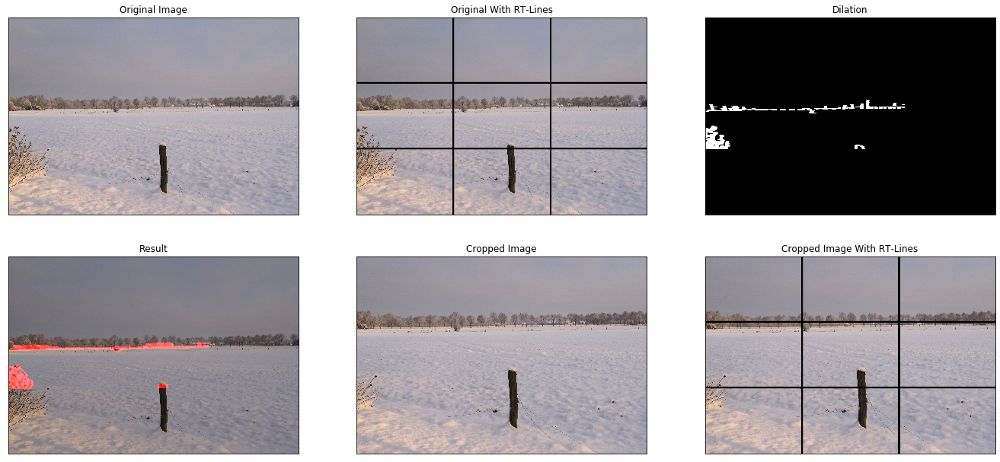

In [27]:
create_aesthetic_image_with_lines('Snow1.png')

Ein weiters Schneebild. In diesem Bild ist der Horizont recht unscharf durch den Nebel und schief. 

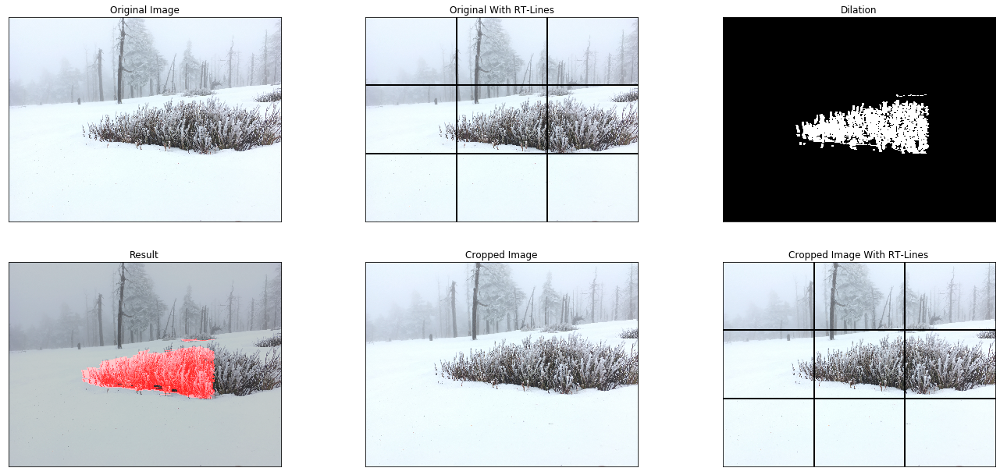

In [28]:
create_aesthetic_image_with_lines('IMGSnow2.JPG')

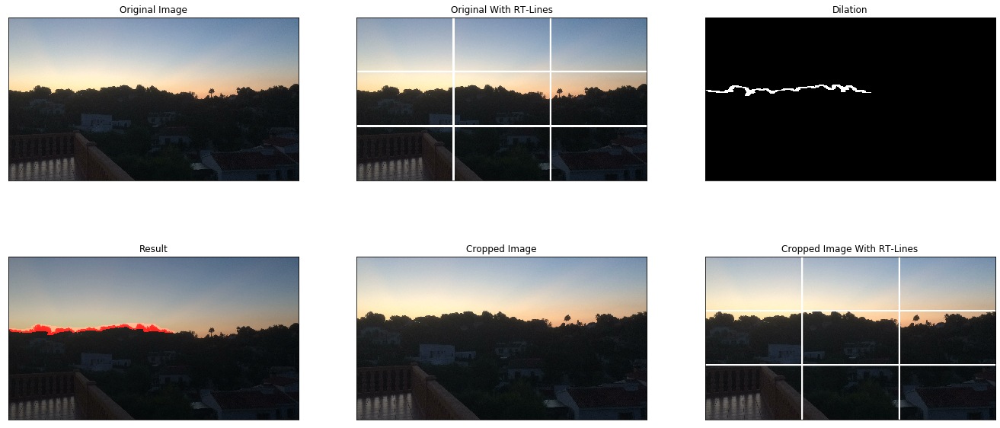

In [29]:
create_aesthetic_image_with_lines('IMGSpain1.JPG')

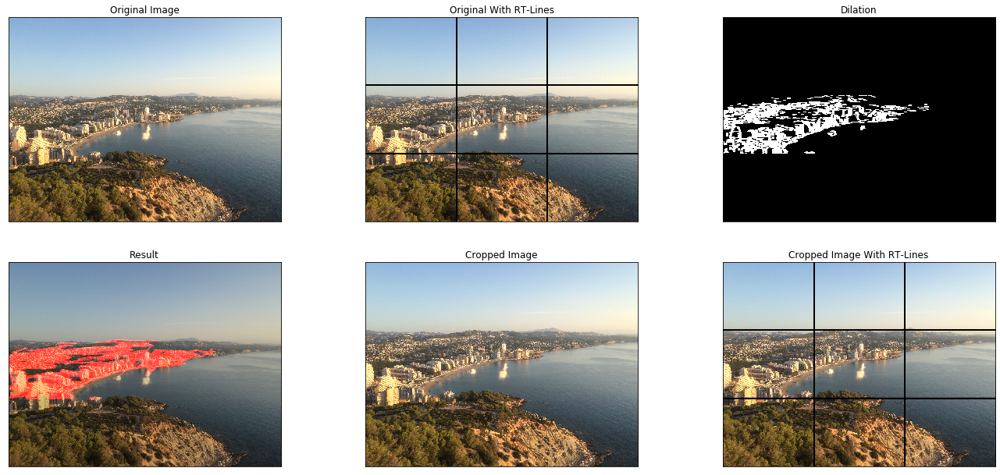

In [30]:
create_aesthetic_image_with_lines('IMGSpain2.JPG')

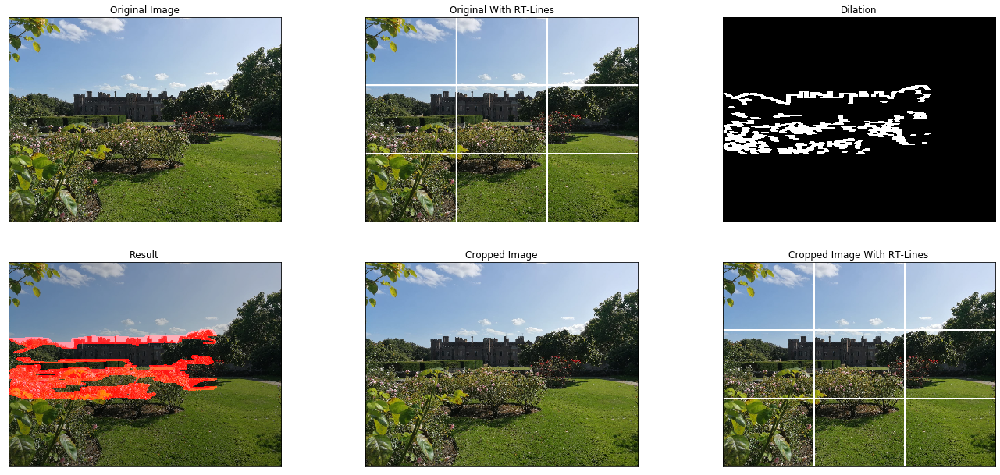

In [31]:
create_aesthetic_image_with_lines('IMGCastle.JPG')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: divide by zero encountered in int_scalars


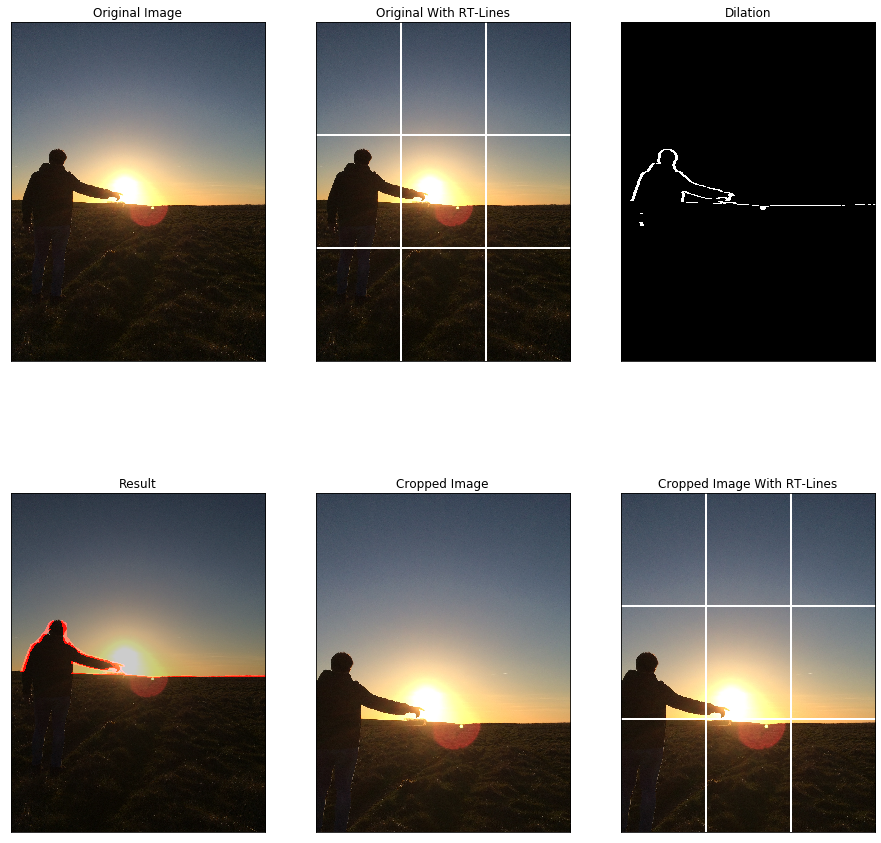

In [32]:
create_aesthetic_image_with_lines('IMGSun.JPG')

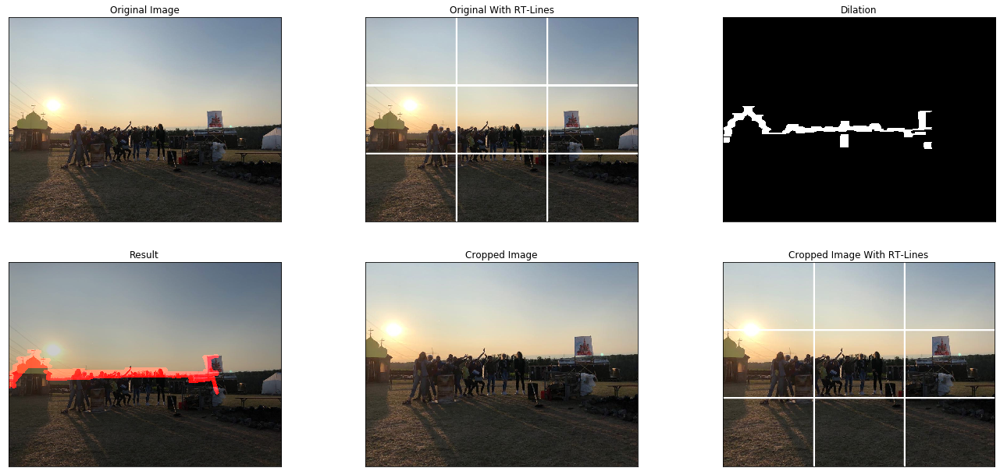

In [33]:
create_aesthetic_image_with_lines('IMGPeople.JPG')

###4.3 Salient Object Detection

Now we are able to make photos with horizontal lines more aesthetic. But everyone have photos of objects, too. And the user should also be able to make these photo more aesthetic with our algorithm. 

To meet this aim we first have to find the object in the image that has to be aligned -- as well as the lines in the previous chapter. Therefore we tested various approaches:
Our first approach was **Hough Circles Transformation** (see section 4.3.1) as we found this function during our researches on Hough Lines Transformations. But we noticed that not every object was round and not every object could be detected with this method. So we looked for other approaches and found the **saliency detection**:
> "*In essence, saliency is what 'stands out' in a photo or scene, enabling your eye-brain connection to quickly (and essentially unconsciously) focus on the most important regions.*"(compare [Saliency Detection](https://www.pyimagesearch.com/2018/07/16/opencv-saliency-detection/))


![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Saliency_Introduction.jpg)

This means that in the image 5 a) we, as observers, would recognize the flower in the middle of the branch as important (see picture 5 b). The saliency map in Figure 5 c) draws the areas in white where the important object is located according to the criteria of *colour, contrast and orientation*. As you can see here, exactly this flower was drawn in white. However, there was also a bit more that was recognized as **focus of attention** (short **FOA**) that we, as observers, would not have designated as such. 

To implement the approach of saliency detection, we first used the functions of OpenCV. However, after some testing we found out that not all objects are recognized. So we ended up with an approach using **Convolutional Neural Networks** (short **CNN**). Due to the lack of time that went into the two previous approaches and the line recognition, we have not been able to create and train our own CNN. But fortunately we were provided with an already trained model: ***PoolNet*** (see [PoolNet](https://github.com/backseason/PoolNet)). 

In the following sections we describe the three approaches in detail.


####4.3.1 Detect Salient Objects - First Approach

In our first approach, we were inspired by the Hough Lines transformation and initially wanted to recognize the objects in a very similar way as well as the horizon. Our idea was that the object in the image is marked by a circle, so we have recognized the object and can align it.

During our research on Hough Lines transformation, we came across the Hough Circles transformation. The advantage we saw in this approach was that the OpenCV method, which records the circles, also calculates the midpoints. Thus, the object could have been aligned to one of the points of interest without further invoices.




In [0]:
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/moewe.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/snail.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/squirrel.jpeg

New we take a look at the implementation: First we convert the RGB image into a grayscale image. To reduce the noise and any interference in the image, we apply a median blur to the image. In this way, we also prevent false circles from being detected.  the Blur with a kernel size of 5 is still small enough to recognize the objects.

After this preparation, we can now apply circle detection to the image. The parameters that are passed to the `HoughCircles` function are the result of trial and error: We have set the resolution slightly below the standard to 0.9. The minimum distance of the center points is set to 120 to reduce the number of detected circles already here. Because the Canny Edge Detector and a Threshold function are applied within the function, the values for this are set in `param1` and `param2`. Because the objects in the image are different in size, neither a lower nor an upper limit has been set for the radius of the circles.

All detected circles are stored in the `circles` array. Before this array is traversed in the for loop and the circles and their centers are drawn into the image, the array is converted into the appropriate data type. The circles are drawn in a black image of the same size as the original image so that no changes are made to the original image. Otherwise the circles would still be visible in the aligned image. The original image and the image with the circles are then added together again using OpenCV's `addWeighted` function to display the result of this step. 



In [0]:
def detect_object_with_cricles(img_name):
  img = load_image(img_name)
  output = img.copy()
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  median = cv2.medianBlur(gray, 5)

  circles = cv2.HoughCircles(median, cv2.HOUGH_GRADIENT, 0.9, 120, param1=50, 
                           param2=30, minRadius=0, maxRadius=0)

  detected_circles = np.uint16(np.around(circles))
  circles_image = np.copy(img) * 0  # creating a blank to draw lines on

  for i in circles[0,:]:
    #draw the outer circle
    img_circle = cv2.circle(img, (i[0], i[1]), i[2], (0, 255, 0), 10)
    #draw center of circle
    img_circle = cv2.circle( img, (i[0], i[1]), 2, (0, 0, 255), 5)
  
  detected_circles = cv2.addWeighted(img_circle, 0.8, circles_image, 1, 0)


  rt_circle = draw_rule_of_thirds(detected_circles)

  titles = ['Grayscale Image', 'Blurred Image', 'Image With Circles', 'Image With Circles and RT-Lines']
  images = [gray, median, detected_circles, rt_circle]

  plot(images, titles)

Now we will test some sample images:

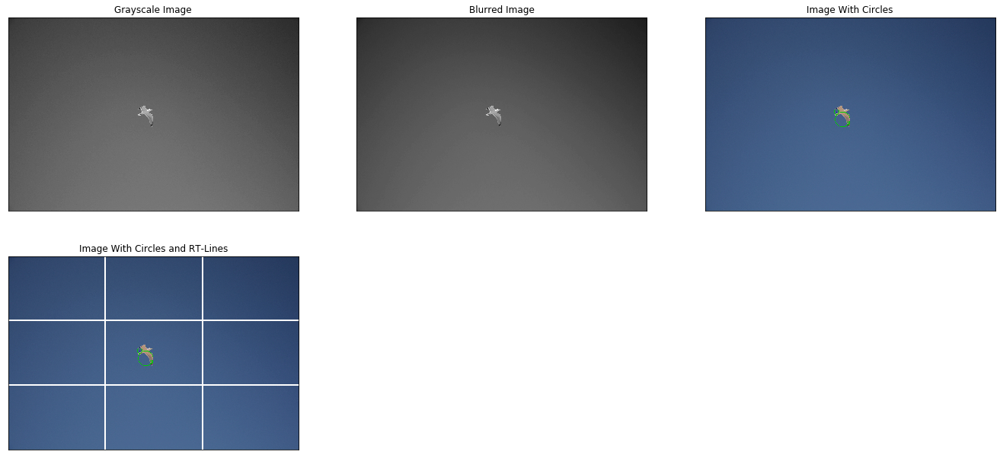

In [36]:
detect_object_with_cricles('moewe.JPG')

In this picture two circles were recognized, although the seagull actually does not represent or contain a circle. If the image would now be aligned to the center of the larger circle, the seagull would not be on the points of interest from the RT lines, because the centers of the circles are not on the seagull. 

Now let's look at a picture with a round object: 

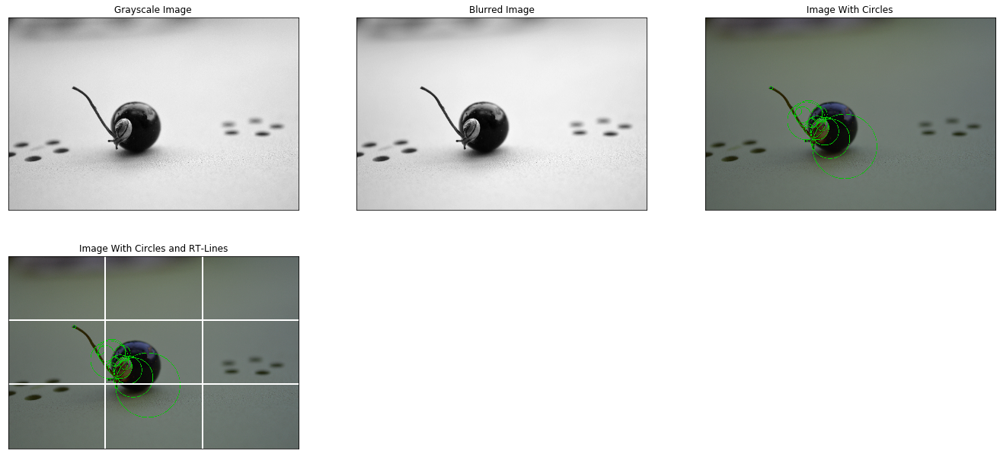

In [37]:
detect_object_with_cricles('snail.JPG')

Here the problem is particularly visible, because a lot of circles are detected. Now you would have to filter according to certain criteria for the circle containing the object to be aligned. However, it is almost impossible to specify such criteria, because the objects have different sizes and can occur anywhere in the image. Unlike the horizon, which occurs only in certain regions of the image. That is why we switched to saliency detection.

####**4.3.2 Detect Salient Objects - Second Approach**

Our next approach was the saliency detection using the features of OpenCV. Here we use the form of *static* saliency detection, because we are only looking at pictures and not at videos where you would use motion saliency.  

There are two functions for static saliency detection: On the one hand the ```StaticSaliencySpectralResidual``` and on the other hand the ```StaticSaliencyFineGrained```. (compare [OpenCV's Saliency Detection](https://www.pyimagesearch.com/2018/07/16/opencv-saliency-detection/))

> ![spectral residual](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/spectralResidualSaliency.jpg) 
(compare http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.125.5641&rep=rep1&type=pdf (last visited 04.02.2020)

First, consider the StaticSaliencySpectralResidual function. Here, the pre-attentive visual search is simulated by the algorithm calculating the logarithmic spectrum. Subsequently the algorithm analyses this log spectrum by calculating the average of the spectrum – plotted in Figure XY c). Further computations then yield the spectral residual, see Figure XY d). Afterwards this spectral residual is transformed into the spatial domain by Fourier transformation and the corresponding saliency map is obtained. (compare [Spectral Residual Saliency](https://docs.opencv.org/3.4/df/d37/classcv_1_1saliency_1_1StaticSaliencySpectralResidual.html))

In [0]:
def spectralResidualSaliency(img_name):
  img = load_image(img_name)
  # initialize OpenCV's static saliency spectral residual detector and compute 
  # the saliency map
  saliency = cv2.saliency.StaticSaliencySpectralResidual_create()
  (success, saliencyMap) = saliency.computeSaliency(img)

  saliencyMap = (saliencyMap * 255)
  # to get a binary map we threshold the saliency map
  threshMap = cv2.threshold(saliencyMap.astype("uint8"), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
  return img, saliencyMap, threshMap

The `StaticSaliencyFineGrained` function, on the other hand, calculates the saliency map based on center-surround differences. As a result, it generates high-resolution saliency maps by using integral images. The integral images are calculated as follows:

> ![Integral Image](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/IntegralImage.jpg)
(compare https://www.mathworks.com/help/images/ref/integralimage.html (last visited 04.02.2020)

The dark green pixel of the input image is the pixel we are looking at. The light green area at pixels to the left and above the considered pixel is summed and returned to the integral image. This result pixel is shown in gray. So we actually have the calculation: Be I'; the integral image of I and (x, y) a pair representing the position of the pixel. Then 
> $I'(x,y) =\sum_{x'\ \le\ x,\ y'\ \le\ y}{I(x',y')}$

This procedure is illustrated in Figure XY a). 
However, there is also a faster calculation. The pixel values in the input image as well as in the integral image are summed. The gray pixel in the integral image I'; at the position (m, n) can be represented as a linear combination of four pixels from the immediate neighborhood: One pixel from the input image is the dark green pixel I(m-1, n-1) and three pixels from the integral image. 
> $I^\prime\left(m,n\right)=I^\prime\left(m,n-1\right)+I^\prime\left(m-1,n\right)+I\left(m-1,n-1\right)-I^\prime\left(m-1,n-1\right)$

The right picture in figure XY b) shows which pixels are summed to calculate the grey pixel. The green pixels are added and the red pixels are subtracted. The red pixel is subtracted, because otherwise the dark green pixel of the input image would appear twice in the sum.


In [0]:
def fineGrainedSaliency(img_name):
  img = load_image(img_name)
  # initialize OpenCV's static saliency fine grained detector and compute the saliency map
  saliencyFG = cv2.saliency.StaticSaliencyFineGrained_create()
  (success, saliencyMap) = saliencyFG.computeSaliency(img)

  saliencyMap = (saliencyMap * 255)
  # to get a binary map we threshold the saliency map
  threshMap = cv2.threshold(saliencyMap.astype("uint8"), 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
  return img, saliencyMap, threshMap


In both functions, i. e. `specturalResidualSaliency` and `fineGrainedSaliency`, the saliency map is multiplied by 255. This is necessary to apply a threshold to them and get binary images instead of maps with different gray levels as you can see below.

First, the `spectralResidualSaliency` is applied to the image with the snail. On the left you can see the original image. To the right of it is the saliency map, where one hardly recognizes pure white areas. However, since binary images with clear edges around the object are necessary to recognize the contours and align the objects, a threshold is applied to the saliency maps. Here, the color range to which the threshold is applied is set to the entire color range from black (0) to white (255). We do this in order to capture the entire object with the threshold. If this area were smaller, parts of the object could be lost and lead to incorrect alignment. The result of the threshold can be seen in the picture on the far right. 

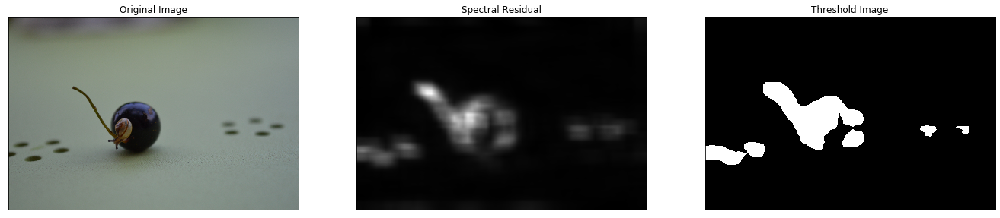

In [40]:
img, saliencyMap, threshMap = spectralResidualSaliency('snail.JPG')
#show images
titles = ['Original Image', 'Spectral Residual', 'Threshold Image']
images = [img, saliencyMap, threshMap]
plot(images, titles)

The fineGrainedSaliency is also applied to the image with the snail. The arrangement of the images is as above. However, a big difference can be seen in the saliency map: Where in the upper saliency map different areas are blurredly marked, in this saliency map it looks as if the image had been passed through a sieve. You can clearly see the structures of the snail on the currant and to the right below the berry even the dirt on the table is marked in the saliency map. By applying the threshold, the structures are even more clearly recognizable, so that the object can be recognized more accurately and then aligned more precisely. 

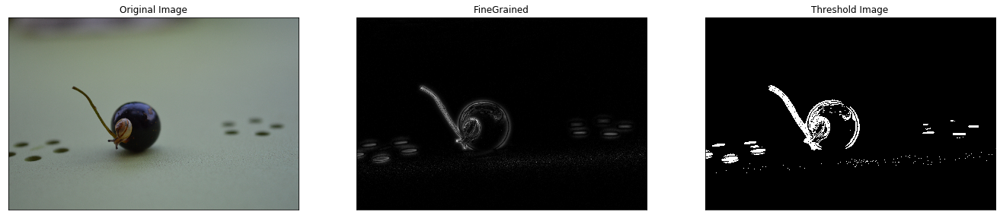

In [41]:
img, saliencyMap, threshMap = fineGrainedSaliency('snail.JPG')

#show images
titles = ['Original Image', 'FineGrained', 'Threshold Image']
images = [img, saliencyMap, threshMap]
plot(images, titles)

To eliminate the small darker dots in the white area and the small white dots in the black area, the so-called salt and pepper, erosion and dilation could be applied.

If you apply the functions just described to other images, you will notice that in many images the important objects are not recognized. The common feature of all these images is that the color contrast is relatively low or the objects are too small. This means that more or less everything in the image is recognised as important, so that no object can be recognised with the saliency map. As you can see in the following picture. 

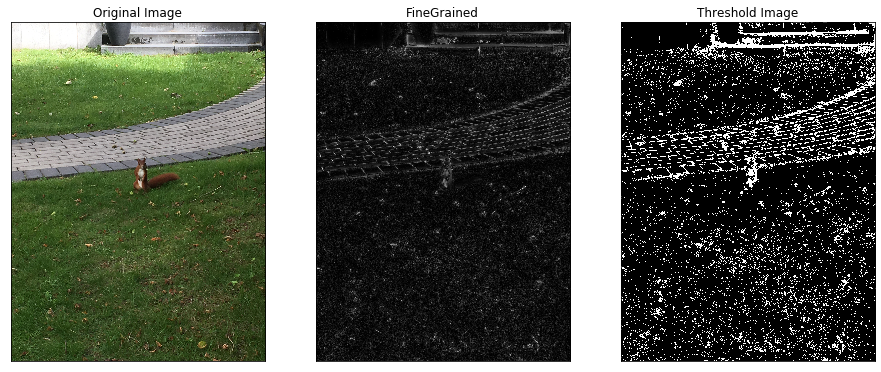

In [42]:
img, saliencyMap, threshMap = fineGrainedSaliency('squirrel.jpeg')

#show images
titles = ['Original Image', 'FineGrained', 'Threshold Image']
images = [img, saliencyMap, threshMap]
plot(images, titles)

Using the saliency maps just calculated, a bounding box can now be drawn around the detected object. The center of this box is then used to align the object to the intersections of the RT lines. This midpoint must first be calculated. This is done in the function below:

In [0]:
def calculate_centre_of_rectangle(box):
  # calculate the funktion of the diagonals of the rectangle
  m1 = (-box[0][1] + box[2][1])/(box[0][0] - box[2][0])
  b1 = -box[0][1] - (m1 * box[0][0])

  m2 = (-box[1][1] + box[3][1])/(box[1][0] - box[3][0])
  b2 = -box[1][1] - (m2 * box[1][0])

  # calculate the intersection of f1 and f2
  centre_x = int((b2 -b1)/(m1-m2))
  centre_y = int(-(m2 * centre_x + b2))

  return centre_x, centre_y

The function gets the calculated bounding box as input. The bounding box is passed as an array. These values are used to calculate the center of the box, as shown in the figure.



> ![alt text](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/Center_calculation.jpg)

In order to calculate the center, a function is set up for each of the straight lines through the diagonals of the bounding box using the corner points. The intersection point of these two lines $f_{1}$ and $f_{2}$ is then calculated. This represents the center of the box and can now be used to align the object (see 4. 3. 4 Crop the Image).

The main task of the following function `findSalientRegions` is to draw the bounding box around the recognized object. First the function gets an image as input and then the `SpectralResidualSaliency` function is executed. We use this method because until a few days ago we had no threshold from the high resolution salinecy map. On the threshold of the generated saliency map we apply the Canny edge detector to detect the edges of the objects. These are then further improved with dilatation and erosion. We use a square 5x5 kernel here, because we don't have to improve horizontal or vertical lines as we do in horizon detection. OpenCV's `findContours` function is then applied to the erosion to detect the contours of the object. Using the code from [Stackoverflow](https://stackoverflow.com/questions/49577973/how-to-crop-the-biggest-object-in-image-with-python-opencv) we  find the largest object, i. e. the largest contour and draw around this the smallest possible bounding box. We create an empty image in the same size as the original image, as we did in the `detect_horizon` function and draw the bounding box with OpenCV's `drawContours` and the center point there. Then the original image and the image with the bounding box are added. The function then returns the original image, the bounding box, the x and y coordinates of the center, the saliency map, the corresponding threshold and the added image, for further calculations and the possible display of intermediate results. 



In [0]:
def find_salient_regions(img):
  img, saliencyMap, threshMap = spectralResidualSaliency(img)
  edges = cv2.Canny(threshMap,50,150,apertureSize = 3)
  kernel = np.ones((5,5),np.uint8)
  dilation = cv2.dilate(edges,kernel,iterations = 3)
  erosion = cv2.erode(dilation,kernel,iterations = 2)
  contours, _ = cv2.findContours(erosion,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
  # Source: https://stackoverflow.com/questions/49577973/how-to-crop-the-biggest-object-in-image-with-python-opencv
  # Find object with the biggest bounding box
  mx_rect = (0,0,0,0)      # biggest skewed bounding box
  mx_area = 0
  for cont in contours:
      arect = cv2.minAreaRect(cont)
      area = arect[1][0]*arect[1][1]
      if area > mx_area:
          mx_rect, mx_area = arect, area

  img_empty = np.copy(img) * 0
  box = cv2.boxPoints(mx_rect)
  #print(box)
  box = np.int0(box)

  centre_x, centre_y = calculate_centre_of_rectangle(box)
  bounding_box = cv2.drawContours(img_empty,[box],0,(200,0,0),5)
  markers = cv2.circle(bounding_box, (centre_x, centre_y), 7, (0,255,0), 5)
  result = cv2.addWeighted(img, 1, markers, 1, 0)
  return img, box, centre_x, centre_y,saliencyMap, threshMap, result 

Below you can see the result.  

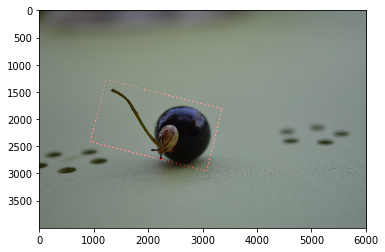

In [45]:
img, box, centre_x, centre_y, saliencyMap, threshMap, roi = find_salient_regions('snail.JPG')
plt.imshow(roi)

The bounding box is around the whole snail on the currant. The bounding box also includes the stem of the currant, as it was also marked in white in the saliency map. Therefore the center of the bounding box is not in the middle of the snail or the currant, as we humans would draw it. You can also see that the bounding box is really big. This is because we used the `spectralResidualSaliency` function, which detects the object very roughly (see saliency map of `spectralResidualSaliency` above).

####4.3.3 Detect Salient Objects with PoolNet

Due to the problems we encountered, we decided to try an approach with Convolutional Neural Networks in the hope of getting better results.

We were allowed to use an already trained model for this: ***PoolNet***. It is "A Simple Pooling-Based Design for Real-Time Salient Object Detection", as the title of the corresponding paper by Liu et al. says. We first download this trained model as a zip file into this notebook and extract it. 

In [46]:
%%bash
curl -J -O  "https://cloudstorage.elearning.uni-oldenburg.de/s/ntRZwGw44MaTYLr/download"
unzip -q poolnet.zip

curl: Saved to filename 'poolnet.zip'


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  186M  100  186M    0     0  15.0M      0  0:00:12  0:00:12 --:--:-- 18.4M


Via torch we can load the .pth file, i. e. the model. 

In [0]:
poolnet = torch.load("poolnet.pth")

With a `predict` function, you can see below, we can now put our images into the model and generate a saliency map. However, we noticed that all images have a too high resolution, because the runtime crashed every time the `predict` function was used. For this reason the images are compressed to 500x500 using the `compress_image` function. The method returns the compressed image and the scaling factor in percent. We need this factor also outside this function, because the image has to be compressed only for the saliency map. For marking the object and cropping the image, the original image is used again, so that the result has the best possible resolution. 

In [0]:
def compress_image(img):
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
  scale_percent = 0

  # calculate the factor to downscale the image preserving the aspect ratio
  if width > height:
    scale_percent = int(500 * 100 / width) #percent of original size
  else:
    scale_percent = int(500 * 100 / height) #percent of original size

  width = int(img.shape[1] * scale_percent / 100)
  height = int(img.shape[0] * scale_percent / 100)
  dim = (width, height)
  # resize image
  resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
  
  return resized, scale_percent

In this function we first calculate the size of the image to find out if the image needs to be compressed. We compress any image larger than 500x500. The image is then brought into the correct shape so that it can be processed by the model. Before the image is put into the model, a tensor is created. The model expects this as input. The saliency map is generated by calling `poolnet`. By `np. squeeze` the saliency map gets transform into a format it can be displayed. Multiply the map by 255 we are able to process it for further calculation and alignment. Again, the original image, the scaling factor in percent and the saliency map are returned, so we can display and use them for further calculations. 

In [0]:
def predict(img):
    image = np.copy(img)
    width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
    scale_percent = 0
    if height > 500 or width > 500:
      image, scale_percent = compress_image(img)

    image_numpy = np.array(image, dtype=np.float32)
    image_numpy = image_numpy.transpose((2, 0, 1))
    image_tensor = torch.Tensor(image_numpy)
    image_tensor = torch.autograd.Variable(image_tensor.unsqueeze(0))

    prediction = poolnet(image_tensor)

    saliency_map = np.squeeze(torch.sigmoid(prediction).cpu().data.numpy())
    saliency_map_scaled = saliency_map * 255
    return image, scale_percent, saliency_map_scaled

This method has not changed from that described in section 4. 3. 2. We just want to execute it here to enable you to try the different approaches of salient object detection independently.

In [0]:
def calculate_centre_of_rectangle(box):
  # calculate the funktion of the diagonals of the rectangle
  m1 = (-box[0][1] + box[2][1])/(box[0][0] - box[2][0])
  b1 = -box[0][1] - (m1 * box[0][0])

  m2 = (-box[1][1] + box[3][1])/(box[1][0] - box[3][0])
  b2 = -box[1][1] - (m2 * box[1][0])

  # calculate the intersection of f1 and f2
  centre_x = int((b2 -b1)/(m1-m2))
  centre_y = int(-(m2 * centre_x + b2))

  return centre_x, centre_y

This function has also already been created in section 4. 3. 2. But here the preprocessing of the saliency map is not necessary anymore because we get a much better saliency map as input. In addition, we multiply the calculated bounding box by a hundredth of the scaling factor, so we use a factor and not the percentage. Now the bounding box can be drawn into the original image with the higher resolution. In order to be able to draw the bounding box into every image, we define the thickness of the lines depending on the maximum height resp. width. The drawing of the bounding box and the center point have remained the same. Only the threshold of the saliency map is missing in the return values, because it is not necessary anymore. 

In [0]:
def find_salient_regions(img, scale_percent, saliency):
  contours, _ = cv2.findContours(saliency.astype("uint8"),cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
  # Source: https://stackoverflow.com/questions/49577973/how-to-crop-the-biggest-object-in-image-with-python-opencv
  # Find object with the biggest bounding box
  mx_rect = (0,0,0,0)      # biggest skewed bounding box
  mx_area = 0
  for cont in contours:
      arect = cv2.minAreaRect(cont)
      area = arect[1][0]*arect[1][1]
      if area > mx_area:
          mx_rect, mx_area = arect, area

  img_empty = np.copy(img) * 0
  box = cv2.boxPoints(mx_rect)
  scale_factor = scale_percent/100
  box_unscaled = box * (1 / scale_factor)
  box = np.int0(box_unscaled)

  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
  thickness = max(width, height) // 200
  centre_x, centre_y = calculate_centre_of_rectangle(box)
  bounding_box = cv2.drawContours(img_empty,[box],0,(200,0,0),thickness)
  markers = cv2.circle(bounding_box, (centre_x, centre_y), 7, (0,255,0), thickness)
  result = cv2.addWeighted(img, 1, markers, 1, 0)

  return img, box, centre_x, centre_y, saliency, result 

Now we can test an example image. First of all, we load the image as usually. Afterwards we are already able to predict the saliency map. Unfortunately, the performance of the prediction is not good: it takes about 30 seconds to generate the saliency map. 

But the result is good. We have identified the seagull as an object. And the white area in the saliency map shows the contour of the object very well. 

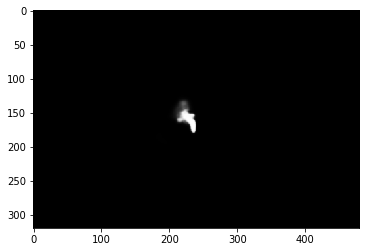

In [52]:
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/moewe.JPG

img = load_image("moewe.JPG")
resized, scale_percent, saliency = predict(img)
plt.imshow(saliency, cmap="gray")
plt.show()

Unfortunately, a comparatively large bounding box is also drawn in here. This is because the gray area of the seagull in the saliency map is also recognized as an object and therefore lies in the bounding box. 

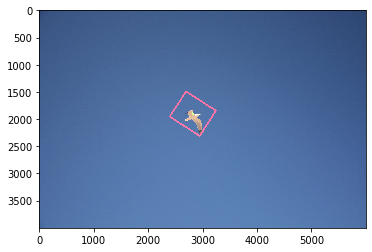

In [53]:
img, box, centre_x, centre_y, saliency, result = find_salient_regions(img, scale_percent, saliency)
plt.imshow(result)

The process in which the saliency map is generated and the bounding box is drawn in has to be done twice in this approach, because we have to cut the image in two steps. However, the second pass is in the next section, since the `predict` function must be applied to the first cropped image. 

####4.3.4 Crop the Image

Since the object must be aligned both horizontally and vertically, the image must be cropped in two steps. In the first step the image is cut vertically. The following graphic shows how the value is calculated, which is cut off from above or below. 

> ![Cropping Objects](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/Berechnung_cropping_objects.jpg)

In a) we calculate the horizontal alignment by comparing the distance of the center of the object to the upper and lower RT line. Then we cut off the shorter distance. In this case the distance to the bottom line is smaller. Therefore we cut from the bottom. To keep the aspect ratio, we multiply the distance by $\frac{3}{2}$. We calculate the new width of the image according to the aspect ratio and cut off the same amount from right and left.

After the object is aligned on the horizontal line, it must be aligned with the vertical lines as shown in b). The procedure is the same as for the horizontal lines. Here, however, it will be cut off from the left or right. And now we will calculate the new height according to the aspect ratio and cut off the same amount from bottom and top. In the end, the object is aligned with the power point that was closest to it as you can see in c). 

In [0]:
def crop_object_img_vertical(img, centre_y):
  img = img.copy()
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)
  distance_to_upper_rt = abs(third_of_height_1 - centre_y)
  distance_to_lower_rt = abs(third_of_height_2 - centre_y)
  closer_to_upper_rt = distance_to_upper_rt < distance_to_lower_rt

  aspect_ratio = height/width

  top_cropping = 0
  bottom_cropping = 0
  left_cropping = 0
  right_cropping = 0

  if closer_to_upper_rt:
    top_cropping = int((3/2) * distance_to_upper_rt)

  else:
    bottom_cropping = int((3/2) * distance_to_lower_rt)
    
  
  # determine the left and right cropping_point of the x-asis, to crop the picture middle-weight
  new_height = height - top_cropping - bottom_cropping
  new_width = int(new_height * (1/aspect_ratio))
  left_cropping = (width - new_width) // 2 
  right_cropping = left_cropping
    
  cropped_img = img[top_cropping:(height - bottom_cropping), left_cropping:(width - right_cropping)]

  return cropped_img

def crop_object_img_horizontal(img, centre_x):
  width, height, third_of_height_1, third_of_height_2, third_of_width_1, third_of_width_2 = generate_image_data(img)

  distance_to_left_rt = abs(third_of_width_1 - centre_x)
  distance_to_right_rt = abs(third_of_width_2 - centre_x)
  closer_to_left_rt = distance_to_left_rt < distance_to_right_rt

  aspect_ratio = height/width

  top_cropping = 0
  bottom_cropping = 0
  left_cropping = 0
  right_cropping = 0

  if closer_to_left_rt:
    left_cropping = int((3/2) * distance_to_left_rt)
  else:
    right_cropping = int((3/2) * distance_to_right_rt)

  # determine the upper and lower cropping_point of the y-axis, to crop the picture middle-weight
  new_width = width - left_cropping - right_cropping
  new_height = int(new_width * aspect_ratio)
  top_cropping = (height - new_height) // 2 
  bottom_cropping = top_cropping
  cropped_img = img[top_cropping:(height - bottom_cropping), left_cropping:(width - right_cropping)]

  return cropped_img

Now we are able to crop the image of the seagull vertically to align it to the upper horizontal RT-line.

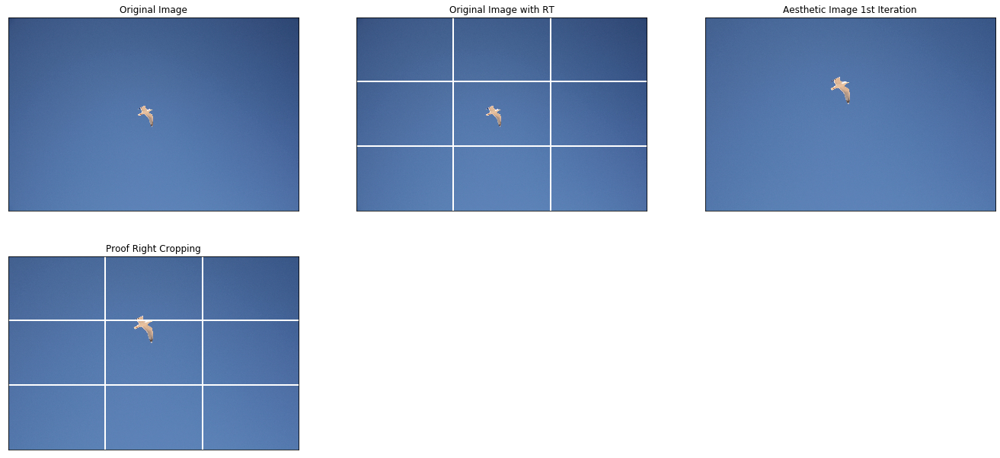

In [55]:
aesthetic = crop_object_img_vertical(img, centre_y)
original_with_rt = draw_rule_of_thirds(img)
proof_aesthetic = draw_rule_of_thirds(aesthetic)

#show images
titles = ['Original Image', 'Original Image with RT', 'Aesthetic Image 1st Iteration', 'Proof Right Cropping']
images = [img, original_with_rt, aesthetic, proof_aesthetic]
plot(images, titles)

By drawing the RT-lines one can see that the centre of the bounding box is perfectly aligned to the upper RT-line.

Now we will use the cropped image, named `aesthetic`, to predict the second salincy map for horizontal alignment. 

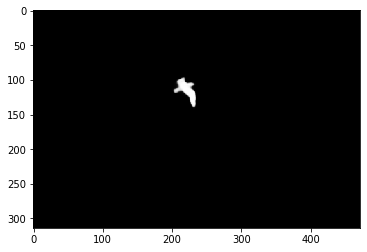

In [56]:
resized, scale_percent, saliency = predict(aesthetic)
plt.imshow(saliency, cmap="gray")
plt.show()

This time again the saliency map is very accurate and even better than the previous one, because there is no grey area visible that does not belong to the object. Accordingly, the bounding box is also smaller and fits the seagull more precisely. This means that the centre of the box is also very centrally located on the seagull. 

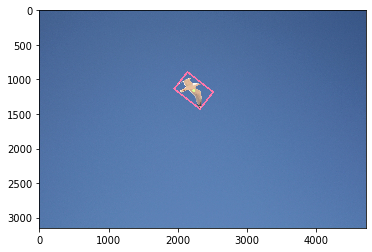

In [57]:
img, box, centre_x, centre_y, saliency, result = find_salient_regions(aesthetic, scale_percent, saliency)
plt.imshow(result)

Now we can crop the image horizontally.

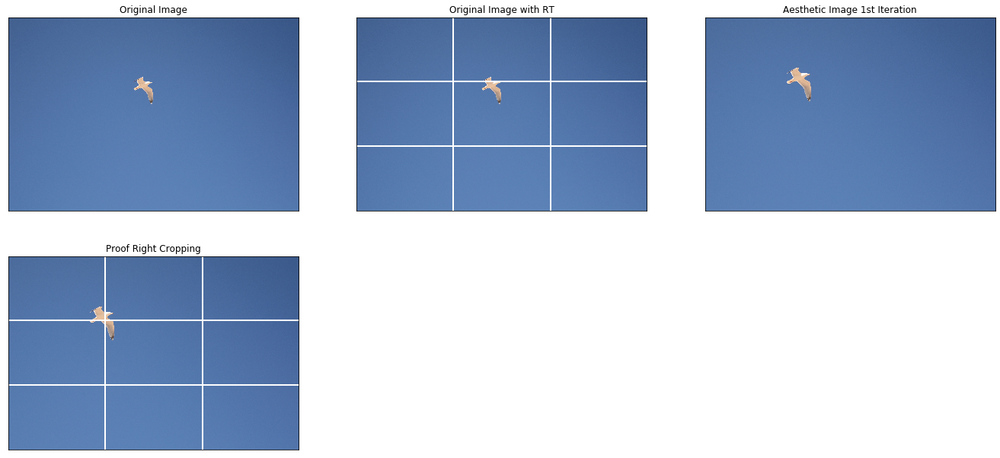

In [58]:
aesthetic = crop_object_img_horizontal(img, centre_x)
original_with_rt = draw_rule_of_thirds(img)
proof_aesthetic = draw_rule_of_thirds(aesthetic)

#show images
titles = ['Original Image', 'Original Image with RT', 'Aesthetic Image 1st Iteration', 'Proof Right Cropping']
images = [img, original_with_rt, aesthetic, proof_aesthetic]
plot(images, titles)

By drawing the RT-lines you can see that the seagull is perfectly aligned to the upper left power point.

####4.3.5 Application to other Images

In [0]:
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/moon.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/snail.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/flower.JPEG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/squirrel.jpeg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/cow.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/dortmund.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/dubai.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/goose.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/greenpeace.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/heart.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/lighthouse1.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/lighthouse2.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/sheep.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/squirrel2.JPG
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/weirdflower.jpg
! wget -q https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Objects/snail3.jpg

In [0]:
def create_aesthetic_image_of_object(img_name):
  print("Your aesthetic photo is created. This may take a few seconds. Thanks a lot.")

  # load the image and create the saliency map
  img = load_image(img_name)
  resized, scale_percent, saliency = predict(img)
  
  # mark the salient region for further calculation and alignment
  img, box, centre_x, centre_y, saliency, result = find_salient_regions(img, scale_percent, saliency)

  # crop the image to align the object in the vertical direction
  aesthetic = crop_object_img_vertical(img, centre_y)

  # create the saliency map of the vertically cropped image to get the value for horizontal alignment
  resized, scale_percent, saliency = predict(aesthetic)

  # mark the salient region for further calculation and horizontal alignment
  img, box, centre_x, centre_y, saliency, result = find_salient_regions(aesthetic, scale_percent, saliency)

  # crop the image to align the object in the horizontal direction on the point of interest
  aesthetic = crop_object_img_horizontal(img, centre_x)
  original_with_rt = draw_rule_of_thirds(img)
  proof_aesthetic = draw_rule_of_thirds(aesthetic)

  if img_name.find('.jpg') != -1:
    img_name_without_dataformat = img_name.replace('.jpg', '')
  elif img_name.find('.JPG') != -1:
    img_name_without_dataformat = img_name.replace('.JPG', '')
  elif img_name.find('.png') != -1:
    img_name_without_dataformat = img_name.replace('.png', '')
  elif img_name.find('.jpeg') != -1:
    img_name_without_dataformat = img_name.replace('.jpeg', '')
  elif img_name.find('.JPEG') != -1:
    img_name_without_dataformat = img_name.replace('.JPEG', '')
  
  save_aesthetic = cv2.cvtColor(aesthetic, cv2.COLOR_BGR2RGB)
  cv2.imwrite('/content/aesthetic_'+img_name_without_dataformat+'.jpg', save_aesthetic)

  # show the images
  titles = ['Original Image', 'Original Image with the RT-lines', 'Aesthetic Image', 'Aesthetic Image with the RT-lines']
  images = [img, original_with_rt, aesthetic, proof_aesthetic]

  plot(images, titles)

Your aesthetic photo is created. This may take a few seconds. Thanks a lot.


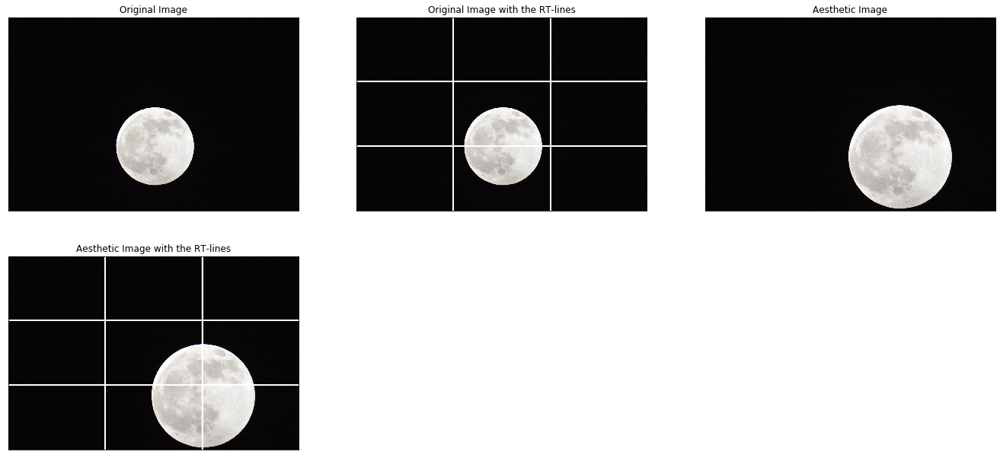

In [67]:
create_aesthetic_image_of_object('moon.JPG')

Your aesthetic photo is created. This may take a few seconds. Thanks a lot.


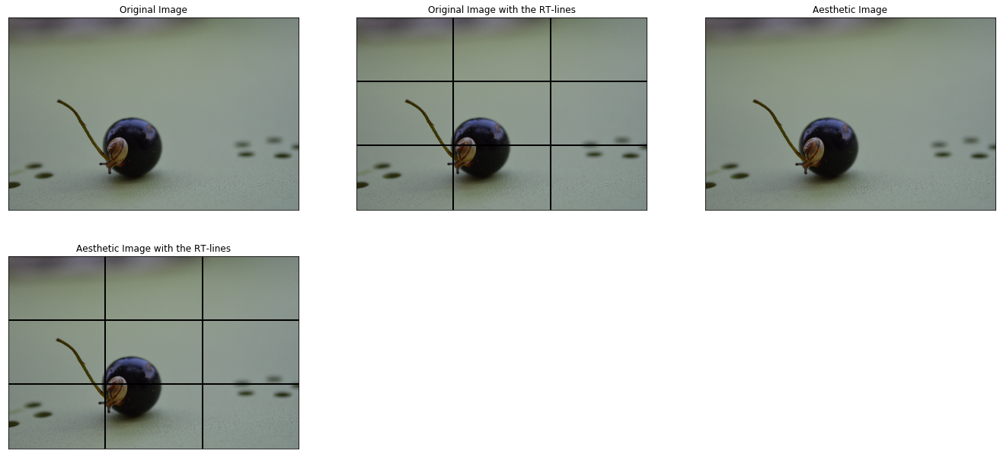

In [68]:
create_aesthetic_image_of_object('snail.JPG')

Your aesthetic photo is created. This may take a few seconds. Thanks a lot.


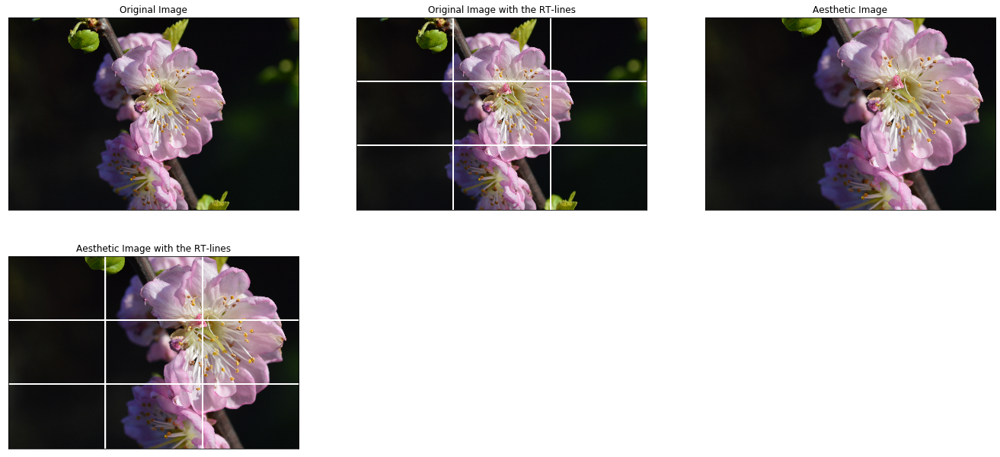

In [69]:
create_aesthetic_image_of_object('flower.JPEG')

In [0]:
create_aesthetic_image_of_object('squirrel.jpeg')

In [0]:
create_aesthetic_image_of_object('cow.jpg')

In [0]:
create_aesthetic_image_of_object('goose.jpg')

In [0]:
create_aesthetic_image_of_object('greenpeace.jpg')

In [0]:
create_aesthetic_image_of_object('heart.jpg')

In [0]:
create_aesthetic_image_of_object('lighthouse1.jpg')

In [0]:
create_aesthetic_image_of_object('lighthouse2.jpg')

In [0]:
create_aesthetic_image_of_object('sheep.jpg')

In [0]:
create_aesthetic_image_of_object('squirrel2.JPG')

In [0]:
create_aesthetic_image_of_object('weirdflower.jpg')

In [0]:
create_aesthetic_image_of_object('snail3.jpg')

##5. Challenges

As in every project, there are always problems that need to be overcome in the course of the work. So we had to fight with some problems, too. Most of them were minor problems and were quickly fixed and corrected. But there were also approaches that we couldn't make work, which we had to throw overboard quickly. For example the Accumulator Array, which can be used with the Hough Transformation to get an even more accurate line recognition, so that at the end a complete line is drawn on the horizon. Unfortunately, we were not able to achieve this goal because we didn't know enough about the code for this. 
Apart from this challenge, there are unfortunately others, such as the fact that a horizon that is too blurred is still not properly recognized. Also an object is not recognized if the background is too unstable. There is also the problem that in an image with a large object sometimes the object to be detected is not the one you want to detect. On the left side of the picture you can see a picture with a cow and it quickly becomes clear that the object to be recognized should be the cow. However, on the right picture it becomes clear that the white area at the bottom left is recognized as the largest object and is therefore also aligned.

![Failed image for object detection](https://raw.githubusercontent.com/uol-mediaprocessing/group-projects-make-it-aesthetic/master/Pictures/Dokumentation/challenges.png)




##6. Limitations and Visions

##7. Reflections and Conclusions

While working together on the "Make it Aesthetic" project, we realized quickly that there were already a lot of libraries of Open CV that could already solve most of our problems. Initially, and almost throughout the entire project, we only used these methods of Open CV. So we did all the horizon detection with Open CV only. And what to say...we are very happy with the result. Of course you could train a CNN to detect horizons already in this part of the project. But we didn't want to do that in this area because we didn't want to lose sight of the fact that this algorithm could also be used in the school area, to bring the programming a little bit closer to the students.


Object Detection also started with an implementation consisting only of Open CV methods. But in this area we wanted to try a CNN, which we did successfully. However, we realized quickly that we should have started to deal with the topic much earlier. Therefore, the second approach of object detection was to automatically detect the object with the help of a CNN and then align it according to the rule of third. 


##8. References

[1] https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.axhline.html